<a href="https://colab.research.google.com/github/Pranav-Marwaha-73/Life_expectancy/blob/main/Life_expectancy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.stats import ttest_ind
import math

from scipy.stats import pearsonr , spearmanr
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler ,MinMaxScaler , LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Regression Models
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor

In [4]:
df=pd.read_csv('/content/Life Expectancy Data.csv')

In [5]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [6]:
df.tail()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.0,68.0,31,...,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.0,7.0,998,...,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.0,73.0,304,...,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.0,76.0,529,...,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8
2937,Zimbabwe,2000,Developing,46.0,665.0,24,1.68,0.0,79.0,1483,...,78.0,7.10,78.0,43.5,547.358878,12222251.0,11.0,11.2,0.434,9.8


In [7]:
df.shape

(2938, 22)

In [8]:
# A Quick Information about the Data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [9]:
# Checking for Null Values
df.isnull().sum()

,0
Country,0
Year,0
Status,0
Life expectancy,10
Adult Mortality,10
infant deaths,0
Alcohol,194
percentage expenditure,0
Hepatitis B,553
Measles,0


In [10]:
df.isnull().sum()/df.shape[0]*100

,0
Country,0.000000
Year,0.000000
Status,0.000000
Life expectancy,0.340368
Adult Mortality,0.340368
infant deaths,0.000000
Alcohol,6.603131
percentage expenditure,0.000000
Hepatitis B,18.822328
Measles,0.000000


In [11]:
df.duplicated().sum()

np.int64(0)

In [12]:
df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [13]:
df.describe(include="object")

,Country,Status
count,2938,2938
unique,193,2
top,Afghanistan,Developing
freq,16,2426


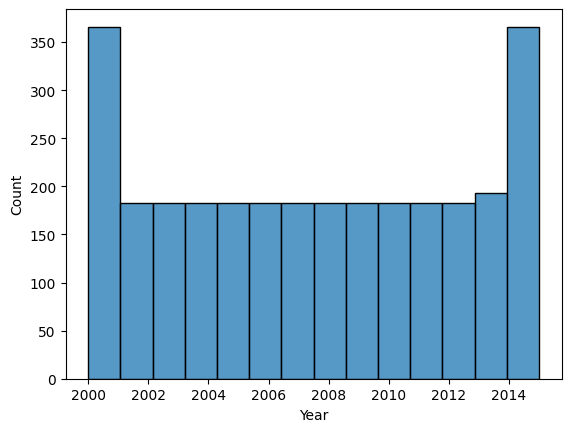

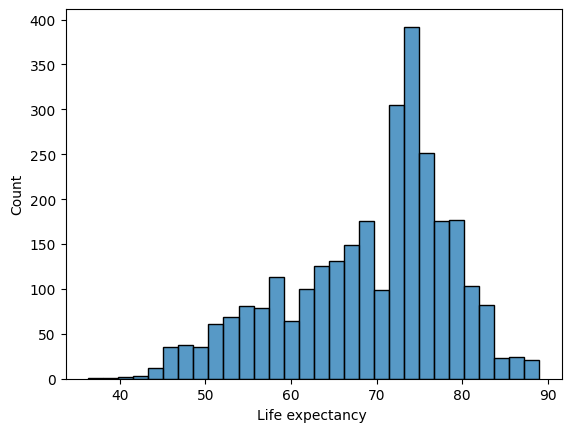

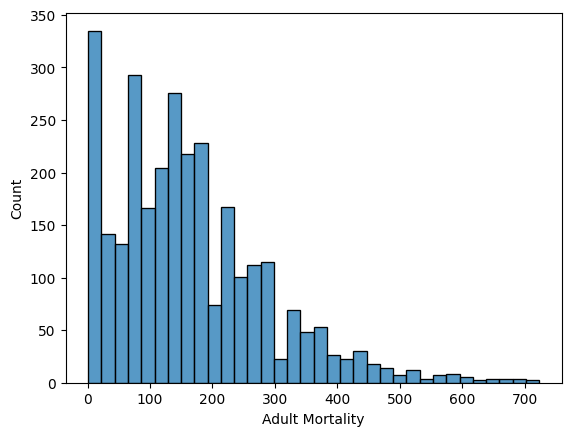

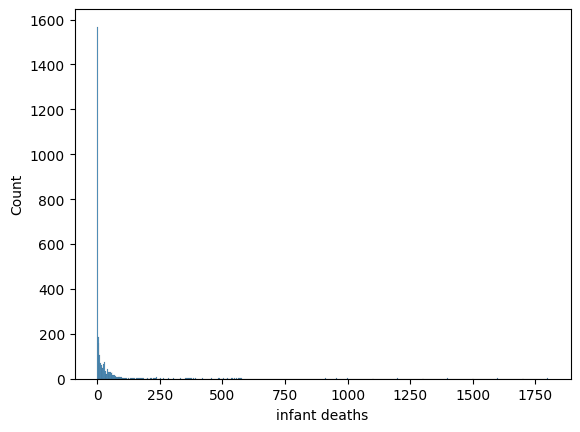

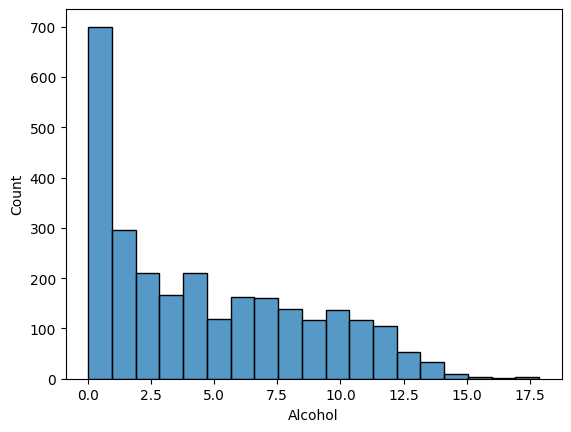

...

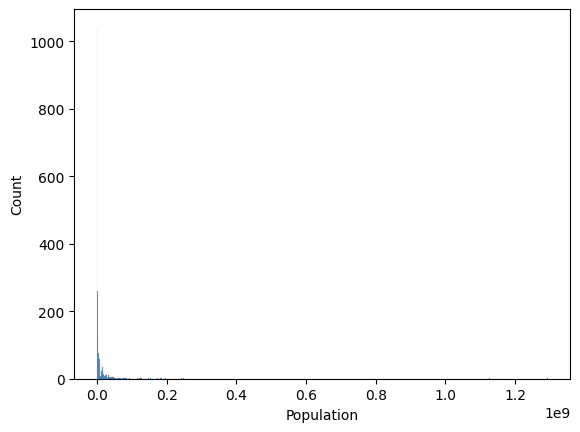

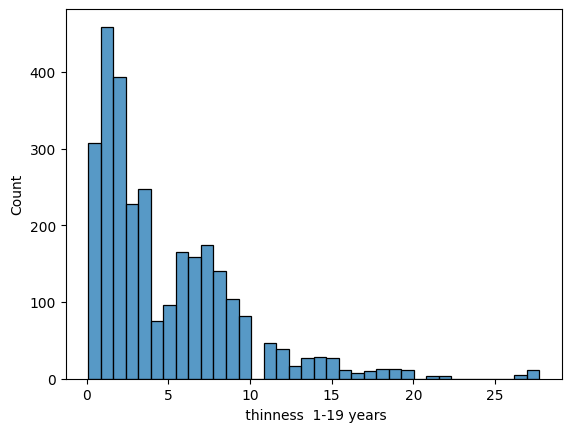

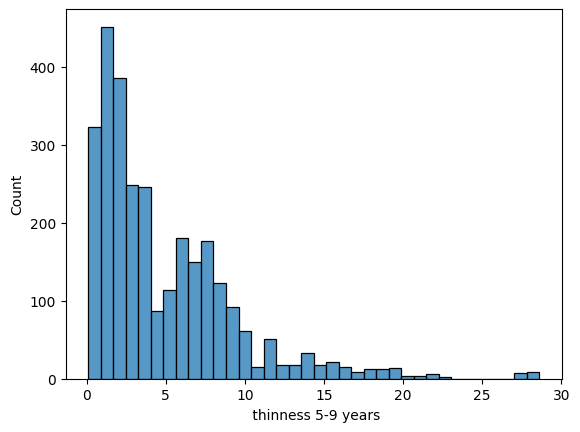

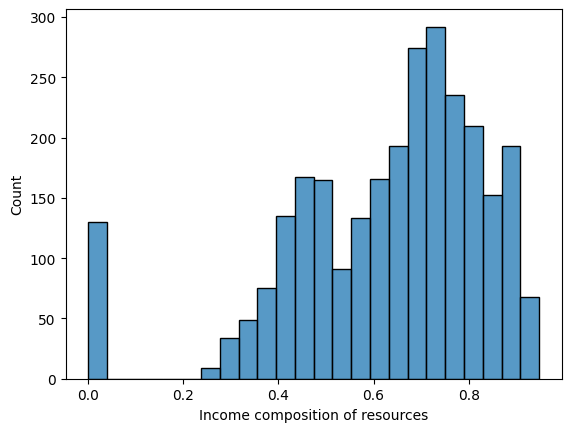

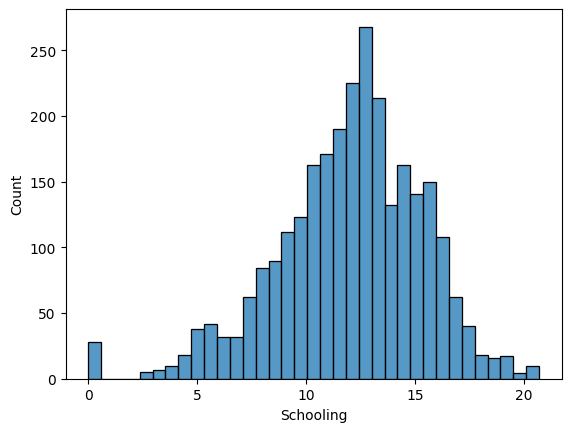

In [14]:
import warnings
warnings.filterwarnings("ignore")
for i in df.select_dtypes(include="number").columns:
  sns.histplot(data=df,x=i)
  plt.show()


In [15]:
import math
data=df
def plot_distributions(data):
    # Remove infinite values and drop missing data
    data = data.replace([np.inf, -np.inf], np.nan).dropna()

    # Get the list of numerical columns
    num_columns = data.select_dtypes(include=['number']).columns.tolist()
    num_features = len(num_columns)

    # Determine grid size
    cols = min(4, num_features)  # Limit to 4 columns per row for readability
    rows = math.ceil(num_features / cols)  # Calculate required rows

    # Create subplots
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
    axes = np.array(axes).flatten()  # Flatten in case of single row

    for i, column in enumerate(num_columns):
        ax = axes[i]
        sns.histplot(data[column], kde=True, ax=ax, color='teal', bins=30)

        # Calculate mean and median
        mean_value = data[column].mean()
        median_value = data[column].median()

        # Add vertical lines for mean and median
        ax.axvline(mean_value, color='firebrick', linestyle='--', label=f'Mean: {mean_value:.2f}')
        ax.axvline(median_value, color='darkgreen', linestyle='-', label=f'Median: {median_value:.2f}')

        # Set plot title and labels
        ax.set_title(f'Distribution of {column}', fontsize=12)
        ax.set_xlabel(column)
        ax.set_ylabel('Frequency')
        ax.legend()

    # Remove unused subplots if any
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # Adjust layout and show
    plt.tight_layout()
    plt.show()

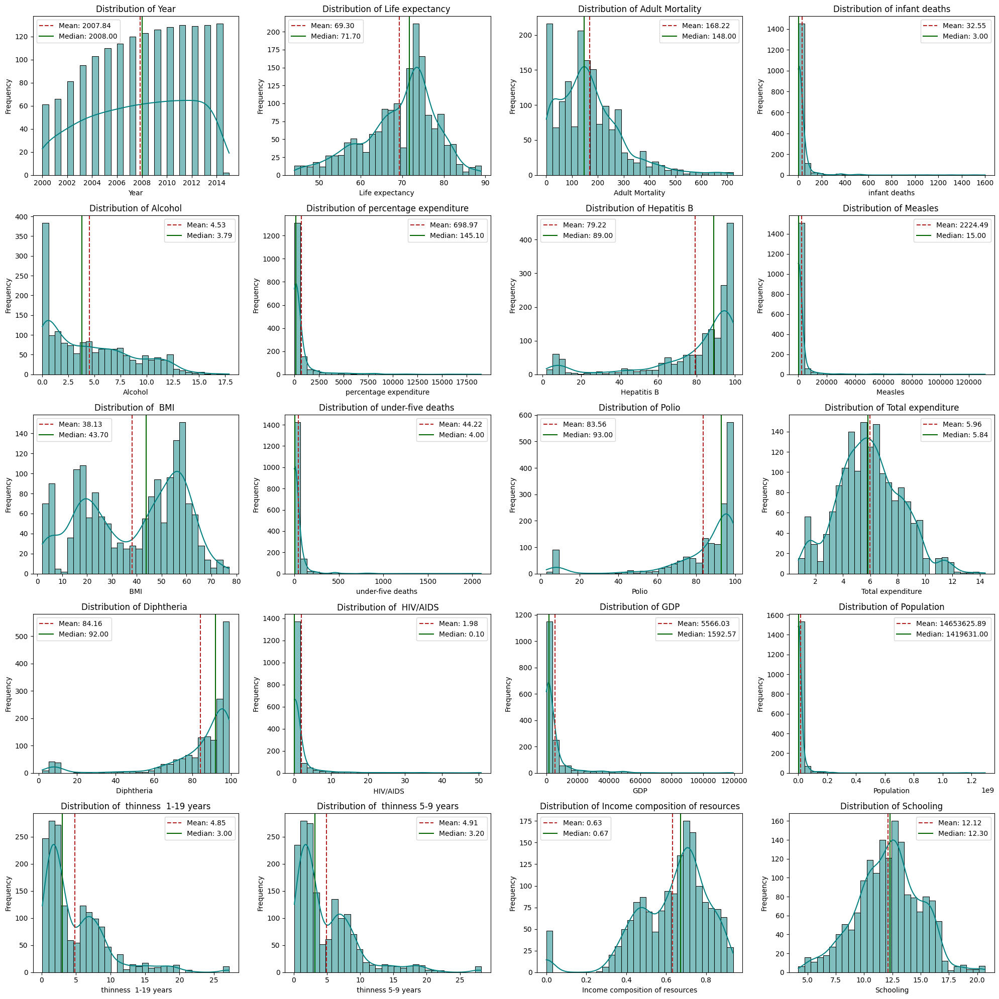

In [16]:
plot_distributions(data)


In [17]:
# checking the realtionship with life expectacing
df.select_dtypes(include="number").columns

Index(['Year', 'Life expectancy ', 'Adult Mortality', 'infant deaths',
       'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles ', ' BMI ',
       'under-five deaths ', 'Polio', 'Total expenditure', 'Diphtheria ',
       ' HIV/AIDS', 'GDP', 'Population', ' thinness  1-19 years',
       ' thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

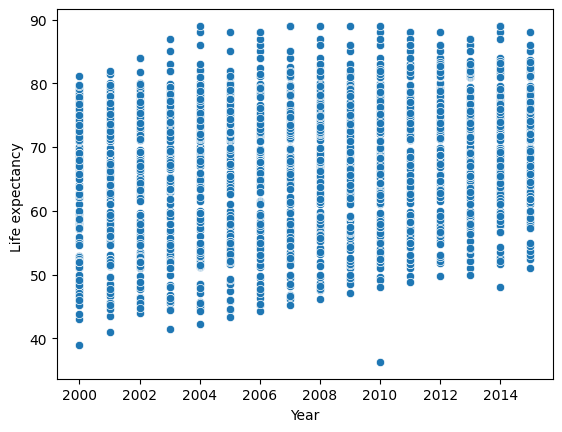

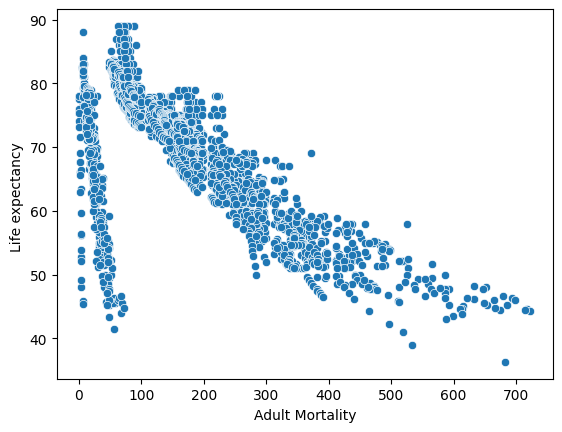

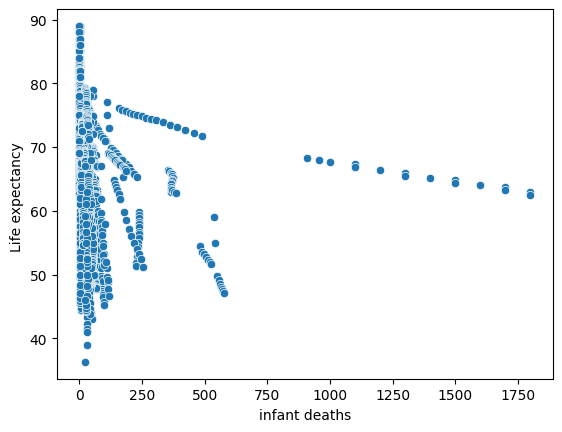

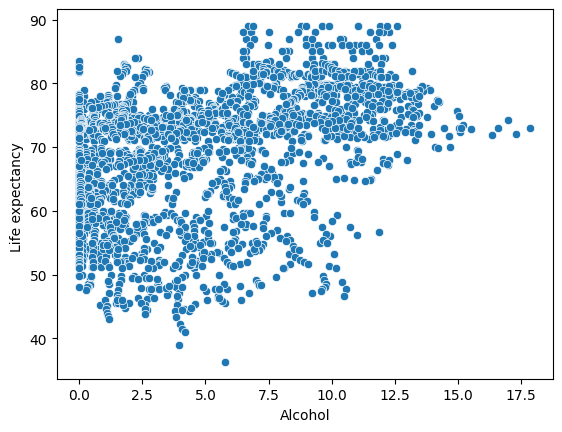

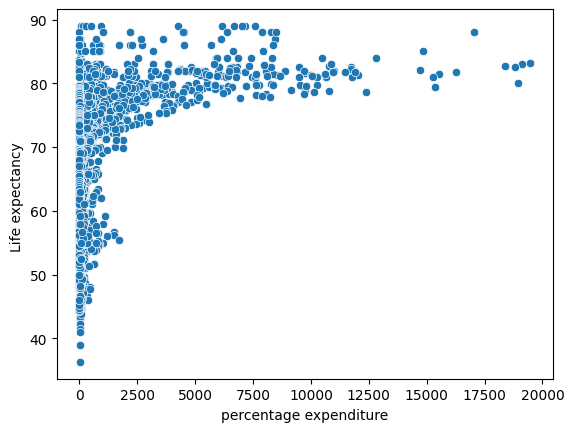

...

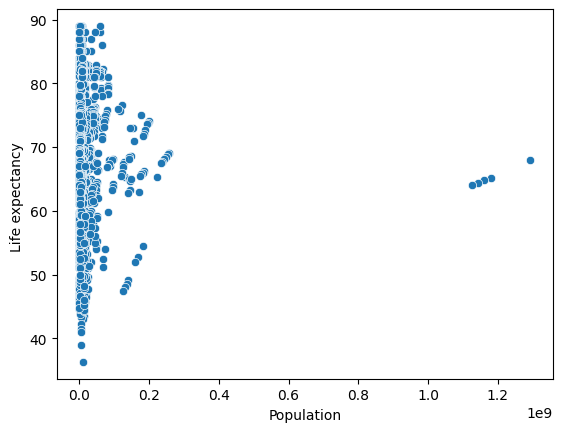

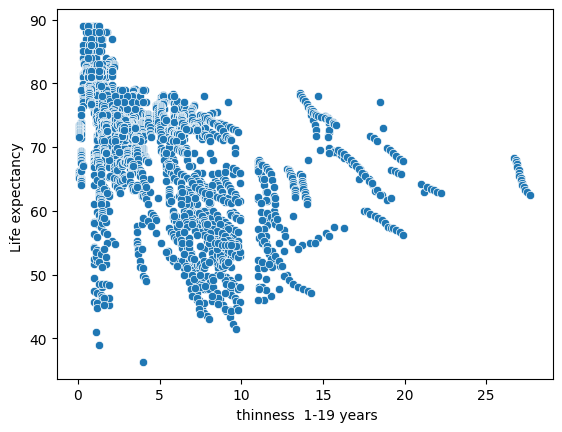

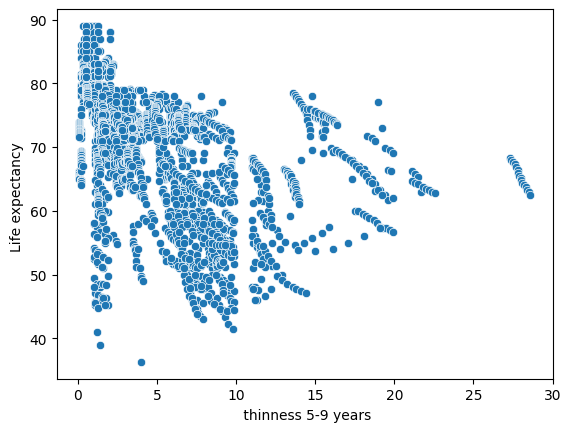

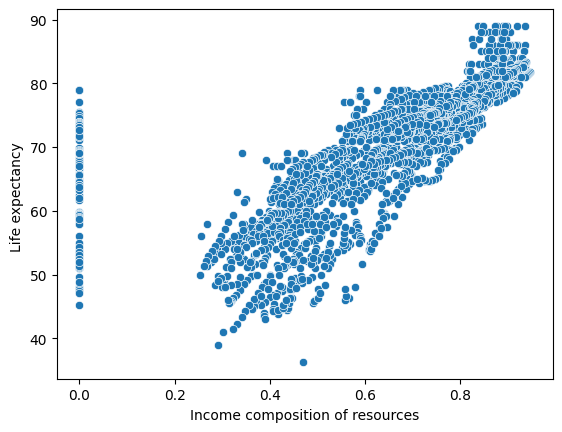

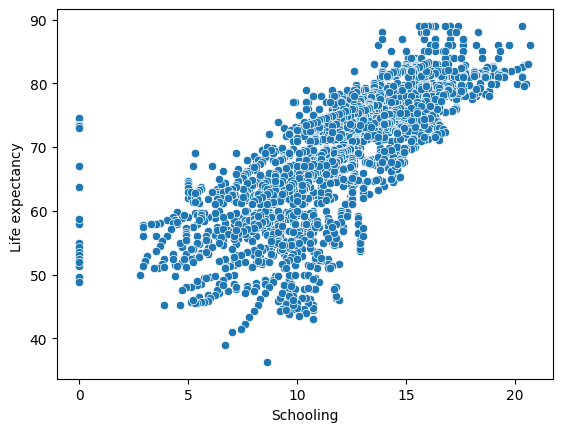

In [18]:
for i in ['Year', 'Adult Mortality', 'infant deaths',
       'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles ', ' BMI ',
       'under-five deaths ', 'Polio', 'Total expenditure', 'Diphtheria ',
       ' HIV/AIDS', 'GDP', 'Population', ' thinness  1-19 years',
       ' thinness 5-9 years', 'Income composition of resources', 'Schooling']:
       sns.scatterplot(data=df,x=i,y="Life expectancy ")
       plt.show()

In [19]:
df.select_dtypes(include="number").corr()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Year,1.000000,0.170033,-0.079052,-0.037415,-0.052990,0.031400,0.104333,-0.082493,0.108974,-0.042937,0.094158,0.090740,0.134337,-0.139741,0.101620,0.016969,-0.047876,-0.050929,0.243468,0.209400
Life expectancy,0.170033,1.000000,-0.696359,-0.196557,0.404877,0.381864,0.256762,-0.157586,0.567694,-0.222529,0.465556,0.218086,0.479495,-0.556556,0.461455,-0.021538,-0.477183,-0.471584,0.724776,0.751975
Adult Mortality,-0.079052,-0.696359,1.000000,0.078756,-0.195848,-0.242860,-0.162476,0.031176,-0.387017,0.094146,-0.274823,-0.115281,-0.275131,0.523821,-0.296049,-0.013647,0.302904,0.308457,-0.457626,-0.454612
infant deaths,-0.037415,-0.196557,0.078756,1.000000,-0.115638,-0.085612,-0.223566,0.501128,-0.227279,0.996629,-0.170689,-0.128616,-0.175171,0.025231,-0.108427,0.556801,0.465711,0.471350,-0.145139,-0.193720
Alcohol,-0.052990,0.404877,-0.195848,-0.115638,1.000000,0.341285,0.087549,-0.051827,0.330408,-0.112370,0.221734,0.296942,0.222020,-0.048845,0.354712,-0.035252,-0.428795,-0.417414,0.450040,0.547378
percentage expenditure,0.031400,0.381864,-0.242860,-0.085612,0.341285,1.000000,0.016274,-0.056596,0.228700,-0.087852,0.147259,0.174420,0.143624,-0.097857,0.899373,-0.025662,-0.251369,-0.252905,0.381952,0.389687
Hepatitis B,0.104333,0.256762,-0.162476,-0.223566,0.087549,0.016274,1.000000,-0.120529,0.150380,-0.233126,0.486171,0.058280,0.611495,-0.112675,0.083903,-0.123321,-0.120429,-0.124960,0.199549,0.231117
Measles,-0.082493,-0.157586,0.031176,0.501128,-0.051827,-0.056596,-0.120529,1.000000,-0.175977,0.507809,-0.136166,-0.106241,-0.141882,0.030899,-0.076466,0.265966,0.224808,0.221072,-0.129568,-0.137225
BMI,0.108974,0.567694,-0.387017,-0.227279,0.330408,0.228700,0.150380,-0.175977,1.000000,-0.237669,0.284569,0.242503,0.283147,-0.243717,0.301557,-0.072301,-0.532025,-0.538911,0.508774,0.546961
under-five deaths,-0.042937,-0.222529,0.094146,0.996629,-0.112370,-0.087852,-0.233126,0.507809,-0.237669,1.000000,-0.188720,-0.130148,-0.195668,0.038062,-0.112081,0.544423,0.467789,0.472263,-0.163305,-0.209373


In [20]:
# correaltion with heatmap
s=df.select_dtypes(include="number").corr()

<Axes: >

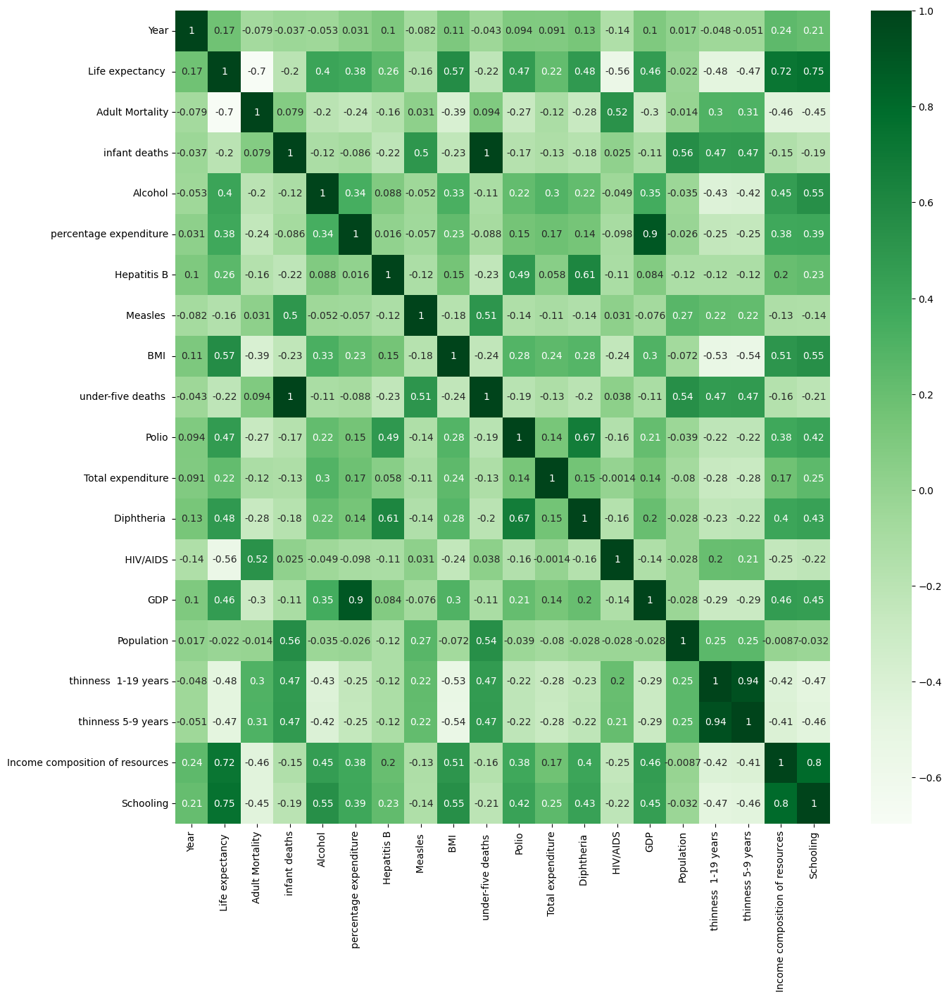

In [23]:
plt.figure(figsize=(15,15))
sns.heatmap(s, annot=True,cmap='Greens')

In [25]:
# treatment of missing value
for i in [" BMI ", "Polio", "Income composition of resources"]: # Added spaces around BMI to match the actual column name
    df[i] = df[i].fillna(df[i].mean()) # Removed inplace=True, assignment already modifies the DataFrame

In [26]:
df.isnull().sum()

,0
Country,0
Year,0
Status,0
Life expectancy,10
Adult Mortality,10
infant deaths,0
Alcohol,194
percentage expenditure,0
Hepatitis B,553
Measles,0


In [27]:
df.isnull().sum()

,0
Country,0
Year,0
Status,0
Life expectancy,10
Adult Mortality,10
infant deaths,0
Alcohol,194
percentage expenditure,0
Hepatitis B,553
Measles,0


In [28]:
# for categorical imputation
from sklearn.impute import KNNImputer
imputer=KNNImputer()

In [29]:
for i in df.select_dtypes(include="number").columns:
  df[i]=imputer.fit_transform(df[[i]])

In [30]:
df.isnull().sum()

,0
Country,0
Year,0
Status,0
Life expectancy,0
Adult Mortality,0
infant deaths,0
Alcohol,0
percentage expenditure,0
Hepatitis B,0
Measles,0


In [31]:
df.shape

(2938, 22)

In [32]:
#outlier treatment

In [33]:
for column in df.columns:
    fig = px.box(df, y=column, title=f'Box Plot for {column}')

    # Update layout to center the title and make it bold
    fig.update_layout(
        title=dict(text=f'<b>Box Plot for {column}</b>', x=0.5),
        boxmode='group'
    )

    fig.show()

In [34]:
# Specify the list of columns you want to handle outliers for
cols_to_handle_outliers = [
    'Adult Mortality', 'infant deaths', 'Alcohol', 'percentage expenditure',
    'Hepatitis B', 'Measles ', ' BMI ', 'under-five deaths ', 'Polio',
    'Total expenditure', 'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
    ' thinness  1-19 years', ' thinness 5-9 years',
    'Income composition of resources', 'Schooling'
]

# Perform outlier handling for each specified column
for col_name in cols_to_handle_outliers:
    # Calculate quartiles and IQR
    q1 = df[col_name].quantile(0.25)
    q3 = df[col_name].quantile(0.75)
    iqr = q3 - q1

    # Define the lower and upper bounds for outliers
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Replace outliers with the mean value of the column
    df[col_name] = np.where((df[col_name] > upper_bound) | (df[col_name] < lower_bound), np.mean(df[col_name]), df[col_name])

In [35]:
for column in df.columns:
    fig = px.box(df, y=column, title=f'Box Plot for {column}')

    # Update layout to center the title and make it bold
    fig.update_layout(
        title=dict(text=f'<b>Box Plot for {column}</b>', x=0.5),
        boxmode='group'
    )

    fig.show()

In [36]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [37]:
df.drop_duplicates()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015.0,Developing,65.0,263.000000,30.303948,0.01,71.279624,65.000000,2419.59224,...,82.550188,8.16,65.0,0.100000,584.259210,1.275338e+07,4.839704,4.870317,0.479,10.1
1,Afghanistan,2014.0,Developing,59.9,271.000000,30.303948,0.01,73.523582,62.000000,492.00000,...,58.000000,8.18,62.0,0.100000,612.696514,3.275820e+05,4.839704,4.870317,0.476,10.0
2,Afghanistan,2013.0,Developing,59.9,268.000000,30.303948,0.01,73.219243,64.000000,430.00000,...,62.000000,8.13,64.0,0.100000,631.744976,1.275338e+07,4.839704,4.870317,0.470,9.9
3,Afghanistan,2012.0,Developing,59.5,272.000000,30.303948,0.01,78.184215,67.000000,2419.59224,...,67.000000,8.52,67.0,0.100000,669.959000,3.696958e+06,4.839704,4.870317,0.463,9.8
4,Afghanistan,2011.0,Developing,59.2,275.000000,30.303948,0.01,7.097109,68.000000,2419.59224,...,68.000000,7.87,68.0,0.100000,63.537231,2.978599e+06,4.839704,4.870317,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004.0,Developing,44.3,164.796448,27.000000,4.36,0.000000,68.000000,31.00000,...,67.000000,7.13,65.0,1.742103,454.366654,1.277751e+07,9.400000,9.400000,0.407,9.2
2934,Zimbabwe,2003.0,Developing,44.5,164.796448,26.000000,4.06,0.000000,80.940461,2419.59224,...,82.550188,6.52,68.0,1.742103,453.351155,1.263390e+07,9.800000,9.900000,0.418,9.5
2935,Zimbabwe,2002.0,Developing,44.8,73.000000,25.000000,4.43,0.000000,73.000000,304.00000,...,73.000000,6.53,71.0,1.742103,57.348340,1.255250e+05,1.200000,1.300000,0.427,10.0
2936,Zimbabwe,2001.0,Developing,45.3,164.796448,25.000000,1.72,0.000000,76.000000,529.00000,...,76.000000,6.16,75.0,1.742103,548.587312,1.236616e+07,1.600000,1.700000,0.427,9.8


In [ ]:
import plotly.express as px
fig=px.histogram(df,x='Life expectancy ',template='plotly_dark')
fig.show()

In [ ]:
fig=px.violin(df,x='Status',y='Life expectancy ',color='Status',template='plotly_dark',box=True,title='Life expectancy Based on Countries status')
fig.show()

In [ ]:
fig=px.line(df.sort_values(by='Year'),x='Year',y='Life expectancy ',animation_frame='Country',animation_group='Year',color='Country',markers=True,template='plotly_dark',title='<b> Country wise Life Expectancy over Years')
fig.show()

In [ ]:
px.scatter(df,y='Adult Mortality',x='Life expectancy ',color='Country',size='Life expectancy ',template='plotly_dark',opacity=0.6,title='<b> Life Expectancy Versus Adult Mortality')

In [ ]:
px.scatter(df,x='Life expectancy ',y='percentage expenditure',color='Country',size='Year',template='plotly_dark',title='<b> Life Expectancy Versus Percentage expenditure')

In [ ]:
px.scatter(df.sort_values(by='Year'),y='infant deaths',x='Life expectancy ',template='plotly_dark',size='Year',color='Country',opacity=0.6,title='<b>Life Expectancy Versus Infant Deaths of Countries in every Year')

In [ ]:
px.scatter_3d(df.sort_values(by='Year'),y='Schooling',x='Life expectancy ',z='Total expenditure',template='plotly_dark',color='Country',size='Total expenditure')

In [ ]:
px.scatter_3d(df.sort_values(by='Year'),y='Adult Mortality',x='Life expectancy ',z='infant deaths',size='Life expectancy ',template='plotly_dark',color='Country')

In [ ]:
px.scatter(df.sort_values(by='Year'),y='Schooling',x='Life expectancy ',animation_frame='Year',animation_group='Country',template='plotly_dark',color='Country',size='Life expectancy ',title='<b> Life expectancy versus Schooling of countries in every year')

In [ ]:
px.scatter(df.sort_values(by='Year'),y='Adult Mortality',x='Life expectancy ',animation_frame='Year',animation_group='Country',color='Country',size='Life expectancy ',opacity=0.6,template='plotly_dark',title='<b> Life Expectancy Versus Adult Mortality in every year')

In [ ]:
px.scatter(df.sort_values(by='Year'),y=' BMI ',x='Life expectancy ',animation_frame='Year',animation_group='Country',template='plotly_dark',color='Country',size='Life expectancy ',opacity=0.6,title='<b> Life expectancy versus BMI of Countries in every Year')

In [ ]:
px.scatter(df.sort_values(by='Year'),y='GDP',x='Life expectancy ',animation_frame='Year',animation_group='Country',template='plotly_dark',color='Country',size='Life expectancy ',title='<b>Life Expectancy Versus GDP of Countries in every Year')

In [ ]:
px.scatter(df.sort_values(by='Year'),y='Population',x='Life expectancy ',animation_frame='Year',animation_group='Country',template='plotly_dark',color='Country',size='Life expectancy ',title='<b>Life Expectancy Versus Population of Countries in every Year')

In [ ]:
# ecoding the data
# dummy=pd.get_dummies(data=df,columns=['Country',"Status"], drop_first=True)

In [ ]:
# dummy.head()

In [ ]:
df['Country'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia (Plurinational State of)', 'Bosnia and Herzegovina',
       'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria',
       'Burkina Faso', 'Burundi', "Côte d'Ivoire", 'Cabo Verde',
       'Cambodia', 'Cameroon', 'Canada', 'Central African Republic',
       'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo',
       'Cook Islands', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus',
       'Czechia', "Democratic People's Republic of Korea",
       'Democratic Republic of the Congo', 'Denmark', 'Djibouti',
       'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia',
       'Georgia', 'Germany'

In [ ]:
df['Status'].unique()

array(['Developing', 'Developed'], dtype=object)

In [ ]:
from sklearn.preprocessing import LabelEncoder
# Columns to apply label encoding
cols_to_encode = ['Country', 'Status']

# Apply label encoding to X
label_encoder_df = LabelEncoder()
for col in cols_to_encode:
    df[col] = label_encoder_df.fit_transform(df[col])

In [ ]:
df['Country'].unique()

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  44,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,
        38,  39,  40,  41,  42,  43,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [ ]:
df['Status'].unique()

array([1, 0])

In [ ]:
 pip install lazypredict

In [ ]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [ ]:
# import lazypredict
from lazypredict.Supervised import LazyRegressor  # Use LazyRegressor for regression
from sklearn.model_selection import train_test_split
import numpy as np

# Selecting only numerical columns
X = data.drop(columns=['Life expectancy ']).values
y = data['Life expectancy '].values

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize LazyClassifier
clf = LazyRegressor()
models, predictions = clf.fit(X_train, X_test, y_train, y_test)

print(models)


100%|██████████| 42/42 [00:37<00:00,  1.12it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000951 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3175
[LightGBM] [Info] Number of data points in the train set: 2350, number of used features: 21
[LightGBM] [Info] Start training from score 69.276978
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
ExtraTreesRegressor                          0.97       0.97  1.50        2.73
HistGradientBoostingRegressor                0.97       0.97  1.62        1.00
LGBMRegressor                                0.97       0.97  1.69        0.25
XGBRegressor                                 0.97       0.97  1.71        0.47
RandomForestRegressor                        0.96       0.97  1.73        8.56
BaggingRegressor                         

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Regression Models
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor


In [ ]:
X = data.drop(columns=['Life expectancy ']).values
y = data['Life expectancy '].values

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
models = {
    "LinearRegression": (LinearRegression(), StandardScaler()),
    "Ridge": (Ridge(alpha=1.0), StandardScaler()),
    "Lasso": (Lasso(alpha=0.1), StandardScaler()),
    "SVR": (SVR(kernel='rbf'), StandardScaler()),
    "DecisionTree": (DecisionTreeRegressor(), MinMaxScaler()),
    "RandomForest": (RandomForestRegressor(), MinMaxScaler()),
    "GradientBoosting": (GradientBoostingRegressor(), MinMaxScaler()),
    "KNN": (KNeighborsRegressor(n_neighbors=5), StandardScaler()),
    "XGBoost": (XGBRegressor(), MinMaxScaler())
}

In [ ]:
param_grid = {
    "LinearRegression": {},
    "Ridge": {'model__alpha': [0.01, 0.1, 1, 10, 100]},  # Regularization strength
    "Lasso": {'model__alpha': [0.001, 0.01, 0.1, 1, 10]},  # Regularization strength
    "SVR": {
        'model__C': [0.1, 1, 10, 100],  # Regularization parameter
        'model__epsilon': [0.01, 0.1, 0.2]  # Defines tolerance margin for regression
    },
    "DecisionTree": {
        'model__max_depth': [None, 5, 10, 20],  # Limits overfitting
        'model__min_samples_split': [2, 5, 10]  # Minimum samples required to split a node
    },
    "RandomForest": {
        'model__n_estimators': [50, 100, 200],  # Number of trees
        'model__max_depth': [None, 5, 10],  # Limits overfitting
        'model__min_samples_split': [2, 5, 10]  # Controls when a node should split
    },
    "GradientBoosting": {
        'model__n_estimators': [50, 100, 200],  # Number of boosting stages
        'model__learning_rate': [0.01, 0.1, 0.2],  # Shrinks contribution of each tree
        'model__max_depth': [3, 5, 10]  # Depth of trees
    },
    "KNN": {'model__n_neighbors': [3, 5, 7, 10], # Number of neighbors
            'model__p': [1, 2]  # Distance metric: 1 for Manhattan, 2 for Euclidean
            },
    "XGBoost": {
        'model__n_estimators': [50, 100, 200],  # Number of boosting rounds
        'model__learning_rate': [0.01, 0.1, 0.2],  # Step size shrinkage
        'model__max_depth': [3, 5, 10]  # Depth of trees
    }
}

In [ ]:
# Store results
results = []

# Training and evaluating models
for name, (model, scaler) in models.items():
    print(f"Training {name}...")

    # Create a pipeline
    pipeline = Pipeline([
        ('scaler', scaler),
        ('model', model)
    ])

    # Grid search with cross-validation
    grid_search = GridSearchCV(pipeline, param_grid[name], cv=5, scoring='r2', n_jobs=-1)
    grid_search.fit(X_train, y_train)

    # Best model evaluation
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)

    # Compute metrics
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)

    # Append results
    results.append([name, grid_search.best_params_, mae, mse, rmse, r2])

    # Save best model if it's the highest R²
    if r2 == max([r[5] for r in results]):
        best_model_overall = best_model

Training LinearRegression...
Training Ridge...
Training Lasso...
Training SVR...
Training DecisionTree...
Training RandomForest...
Training GradientBoosting...
Training KNN...
Training XGBoost...


In [ ]:
results_df = pd.DataFrame(results, columns=["Model", "Best Params", "MAE", "MSE", "RMSE", "R²"])
results_df

,Model,Best Params,MAE,MSE,RMSE,R²
0,LinearRegression,{},2.68,12.59,3.55,0.85
1,Ridge,{'model__alpha': 10},2.67,12.57,3.55,0.85
2,Lasso,{'model__alpha': 0.001},2.68,12.59,3.55,0.85
3,SVR,"{'model__C': 100, 'model__epsilon': 0.1}",1.41,4.84,2.20,0.94
4,DecisionTree,"{'model__max_depth': 10, 'model__min_samples_s...",1.58,5.96,2.44,0.93
5,RandomForest,"{'model__max_depth': None, 'model__min_samples...",1.11,3.00,1.73,0.97
6,GradientBoosting,"{'model__learning_rate': 0.1, 'model__max_dept...",1.08,2.70,1.64,0.97
7,KNN,"{'model__n_neighbors': 3, 'model__p': 1}",1.22,3.72,1.93,0.96
8,XGBoost,"{'model__learning_rate': 0.2, 'model__max_dept...",1.08,2.71,1.65,0.97


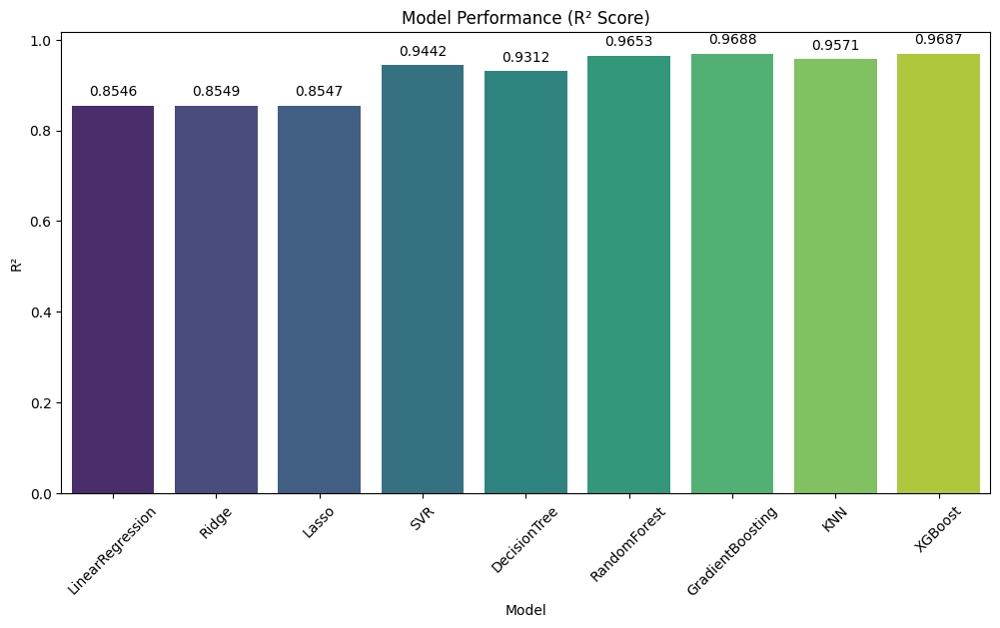

In [ ]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x="Model", y="R²", data=results_df, palette="viridis")
plt.title("Model Performance (R² Score)")
plt.xticks(rotation=45)

for p in ax.patches:
    ax.annotate(
        f'{p.get_height():.4f}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='center',
        xytext=(0, 10),  # Adjust vertical offset of text
        textcoords='offset points'
    )

plt.show()

Mean Squared Error: 2.9090252465640924
R-squared Score: 0.9664221625369424


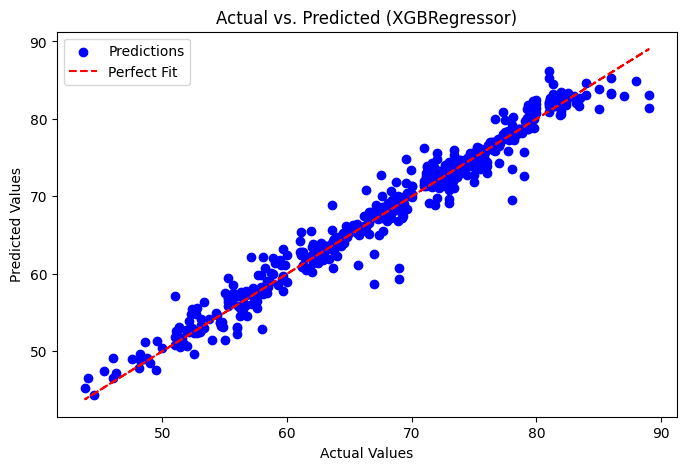

In [ ]:
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
model = XGBRegressor()
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")
# Visualization of Actual vs. Predicted
plt.figure(figsize=(8, 5))
plt.scatter(y_test, y_pred, color='blue', label='Predictions')
plt.plot(y_test, y_test, color='red', linestyle='dashed', label='Perfect Fit')  # Ideal line
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted (XGBRegressor)")
plt.legend()
plt.show()


Cross-Validation R^2 Scores: [0.95710007 0.96618211 0.95506959 0.9494274  0.94964199]
Mean Cross-Validation R^2 Score: 0.9554842309550959
Mean Squared Error: 2.9090252465640924
R-squared Score: 0.9664221625369424


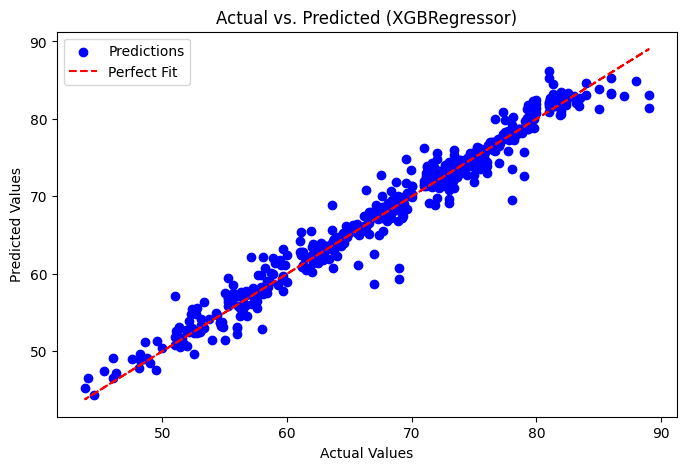

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
model = XGBRegressor()
model.fit(X_train, y_train)

# Perform cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='r2')
print(f"Cross-Validation R^2 Scores: {cv_scores}")
print(f"Mean Cross-Validation R^2 Score: {np.mean(cv_scores)}")

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")

# Visualization of Actual vs. Predicted
plt.figure(figsize=(8, 5))
plt.scatter(y_test, y_pred, color='blue', label='Predictions')
plt.plot(y_test, y_test, color='red', linestyle='dashed', label='Perfect Fit')  # Ideal line
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted (XGBRegressor)")
plt.legend()
plt.show()


Cross-Validation R^2 Scores: [0.95710007 0.96618211 0.95506959 0.9494274  0.94964199]
Mean Cross-Validation R^2 Score: 0.9554842309550959
Mean Squared Error: 2.9090252465640924
R-squared Score: 0.9664221625369424
Random Actual vs Predicted values:
   Actual  Predicted
0   75.10      75.20
1   82.00      81.50
2   85.00      83.82
3   62.60      61.84
4   56.70      57.73
5   44.50      44.33
6   69.40      68.97
7   65.70      65.83
8   60.00      62.43
9   63.80      62.96


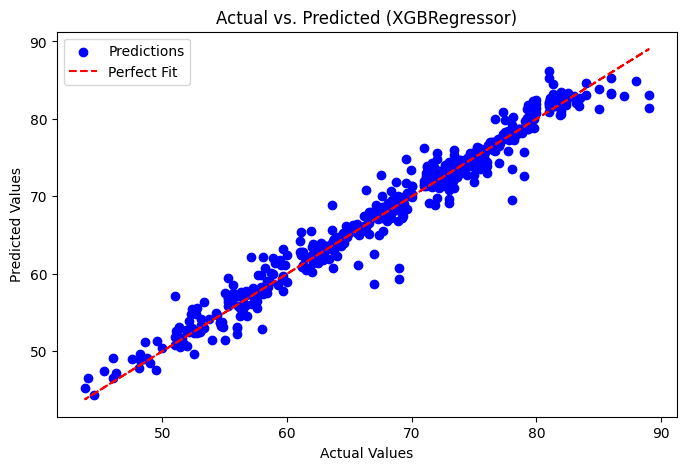

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
model = XGBRegressor()
model.fit(X_train, y_train)

# Perform cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='r2')
print(f"Cross-Validation R^2 Scores: {cv_scores}")
print(f"Mean Cross-Validation R^2 Score: {np.mean(cv_scores)}")

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")

# Display random actual vs predicted values
random_indices = np.random.choice(len(y_test), 10, replace=False)
comparison_df = pd.DataFrame({
    'Actual': y_test[random_indices],
    'Predicted': y_pred[random_indices]
})
print("Random Actual vs Predicted values:")
print(comparison_df)

# Visualization of Actual vs. Predicted
plt.figure(figsize=(8, 5))
plt.scatter(y_test, y_pred, color='blue', label='Predictions')
plt.plot(y_test, y_test, color='red', linestyle='dashed', label='Perfect Fit')  # Ideal line
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted (XGBRegressor)")
plt.legend()
plt.show()
